In [1]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, roc_curve

In [2]:
#pip install pandas-profiling #this install outside of code in terminal or command prompt
#from pandas_profiling import ProFileReport

In [3]:
pwd

'/Users/sysadmin'

In [4]:
df= pd.read_csv('winequality-red.csv')

In [5]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [6]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [7]:
#this show unique quality, quantity
set(df.quality)

{3, 4, 5, 6, 7, 8}

In [8]:
from ydata_profiling import ProfileReport

In [9]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
#for plotting plots and decision tree we need saperate variables
x= df.drop(columns='quality')

In [11]:
y= df.quality

In [12]:
#here we are spliting data into 75: 25 ratio
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=.25, random_state=30)

In [13]:
x_train.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1178,5.6,0.915,0.00,2.1,0.041,17.0,78.0,0.99346,3.68,0.73,11.4
1189,8.8,0.955,0.05,1.8,0.075,5.0,19.0,0.99616,3.30,0.44,9.6
161,7.6,0.680,0.02,1.3,0.072,9.0,20.0,0.99650,3.17,1.08,9.2
109,8.1,0.785,0.52,2.0,0.122,37.0,153.0,0.99690,3.21,0.69,9.3
961,7.1,0.560,0.14,1.6,0.078,7.0,18.0,0.99592,3.27,0.62,9.3


In [14]:
x_test

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1147,10.0,0.410,0.45,6.20,0.071,6.0,14.0,0.99702,3.21,0.49,11.8
659,7.1,0.840,0.02,4.40,0.096,5.0,13.0,0.99700,3.41,0.57,11.0
871,6.9,0.560,0.03,1.50,0.086,36.0,46.0,0.99522,3.53,0.57,10.6
1333,9.1,0.775,0.22,2.20,0.079,12.0,48.0,0.99760,3.18,0.51,9.6
1411,6.4,0.470,0.40,2.40,0.071,8.0,19.0,0.99630,3.56,0.73,10.6
...,...,...,...,...,...,...,...,...,...,...,...
721,8.9,0.480,0.24,2.85,0.094,35.0,106.0,0.99820,3.10,0.53,9.2
490,9.3,0.775,0.27,2.80,0.078,24.0,56.0,0.99840,3.31,0.67,10.6
575,12.3,0.270,0.49,3.10,0.079,28.0,46.0,0.99930,3.20,0.80,10.2
1051,8.5,0.460,0.59,1.40,0.414,16.0,45.0,0.99702,3.03,1.34,9.2


In [15]:
#using decision tree
dt_model = DecisionTreeClassifier()

In [16]:
dt_model.fit(x_train, y_train)

DecisionTreeClassifier()

In [17]:
import sklearn
import matplotlib.pyplot as plt
from sklearn import tree
%matplotlib inline

In [18]:
sklearn.__version__

'1.2.2'

[Text(0.5454318458829902, 0.9722222222222222, 'x[10] <= 10.35\ngini = 0.642\nsamples = 1199\nvalue = [8, 35, 512, 477, 153, 14]'),
 Text(0.3184639084507042, 0.9166666666666666, 'x[6] <= 95.5\ngini = 0.528\nsamples = 666\nvalue = [6, 20, 406, 209, 23, 2]'),
 Text(0.19857462080173346, 0.8611111111111112, 'x[9] <= 0.585\ngini = 0.554\nsamples = 584\nvalue = [6, 19, 332, 202, 23, 2]'),
 Text(0.07411294691224268, 0.8055555555555556, 'x[6] <= 90.5\ngini = 0.468\nsamples = 261\nvalue = [3, 14, 179, 63, 2, 0]'),
 Text(0.05171993499458288, 0.75, 'x[10] <= 9.075\ngini = 0.453\nsamples = 250\nvalue = [3, 14, 176, 55, 2, 0]'),
 Text(0.01733477789815818, 0.6944444444444444, 'x[6] <= 39.0\ngini = 0.604\nsamples = 15\nvalue = [0, 2, 6, 7, 0, 0]'),
 Text(0.010400866738894909, 0.6388888888888888, 'x[0] <= 7.1\ngini = 0.406\nsamples = 8\nvalue = [0, 1, 1, 6, 0, 0]'),
 Text(0.006933911159263272, 0.5833333333333334, 'x[0] <= 6.95\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0, 0, 0]'),
 Text(0.003466955579

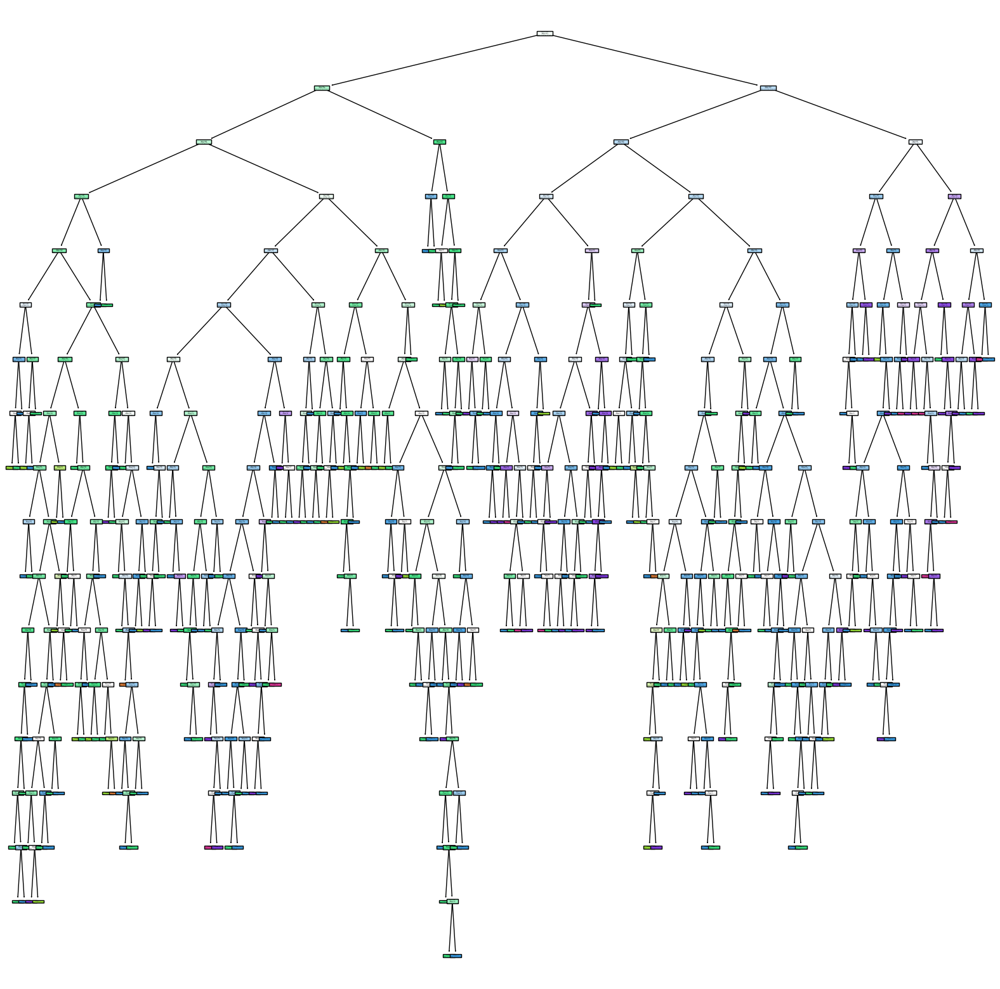

In [19]:
plt.figure (figsize=(20,20))
tree.plot_tree(dt_model,filled=True)

In [20]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [21]:
df1=df.head(50)

In [22]:
x1= df1.drop(columns='quality')

In [23]:
y1= df1.quality

In [24]:
dt_model1 = DecisionTreeClassifier()
dt_model1.fit(x1, y1)

DecisionTreeClassifier()

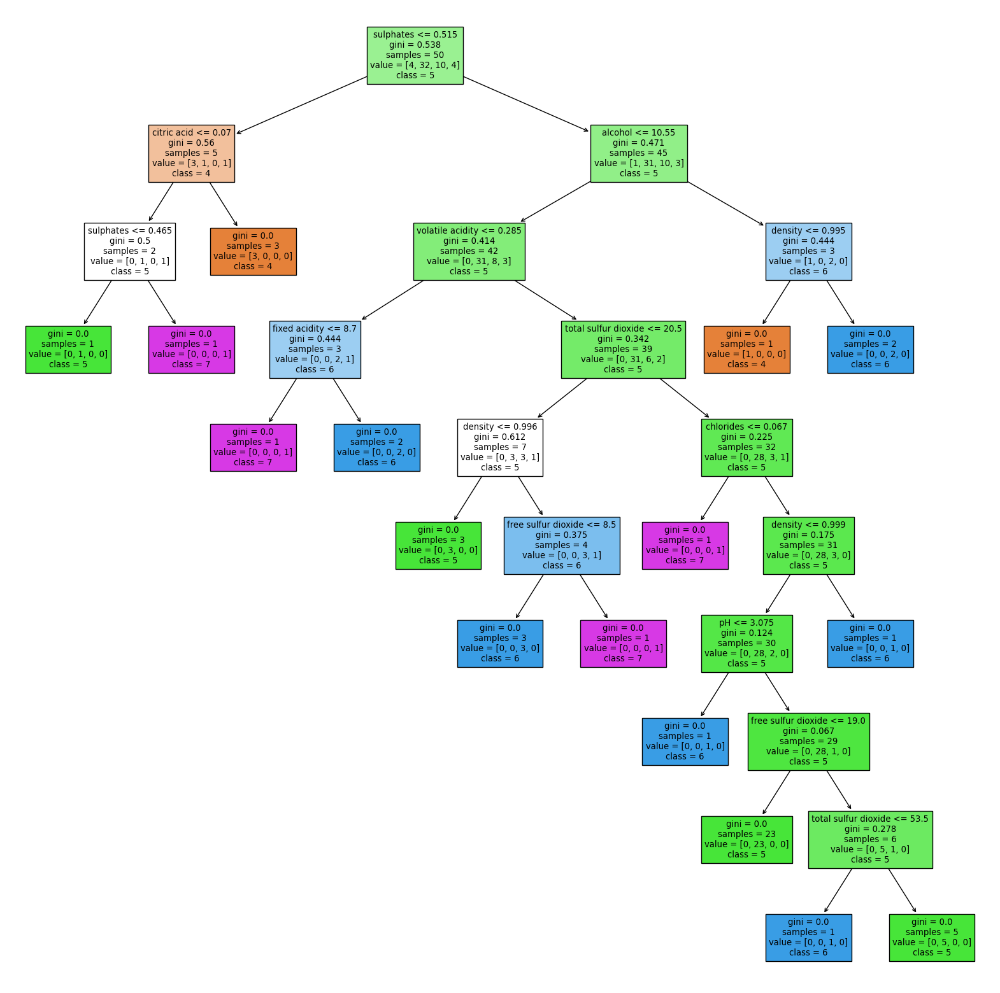

In [25]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1, filled=True, class_names=[str(i)for i in set(y1)],feature_names=x1.columns)
plt.savefig('dt_model_1')

In [26]:
y1

0     5
1     5
2     5
3     6
4     5
5     5
6     5
7     7
8     7
9     5
10    5
11    5
12    5
13    5
14    5
15    5
16    7
17    5
18    4
19    6
20    6
21    5
22    5
23    5
24    6
25    5
26    5
27    5
28    5
29    6
30    5
31    6
32    5
33    6
34    5
35    6
36    6
37    7
38    4
39    5
40    5
41    4
42    6
43    5
44    5
45    4
46    5
47    5
48    5
49    5
Name: quality, dtype: int64

In [27]:
[str(i)for i in set (y1)]

['4', '5', '6', '7']

In [28]:
set(y1)

{4, 5, 6, 7}

In [29]:
dt_model1.predict(x1)

array([5, 5, 5, 6, 5, 5, 5, 7, 7, 5, 5, 5, 5, 5, 5, 5, 7, 5, 4, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6, 5, 6, 5, 6, 5, 6, 6, 7, 4, 5, 5, 4, 6, 5,
       5, 4, 5, 5, 5, 5])

In [30]:
dt_model1.score(x_test, y_test)

0.435

In [31]:
#pruning used to avoide overfitting
path= dt_model1.cost_complexity_pruning_path(x1, y1)
ccp_alpha= path.ccp_alphas

In [32]:
path

{'ccp_alphas': array([0.        , 0.01931034, 0.02      , 0.02666667, 0.02666667,
        0.03      , 0.0348832 , 0.0353629 , 0.036     , 0.04645833,
        0.052     , 0.0576    ]),
 'impurities': array([0.        , 0.03862069, 0.05862069, 0.08528736, 0.11195402,
        0.14195402, 0.21172043, 0.24708333, 0.28308333, 0.376     ,
        0.48      , 0.5376    ])}

In [33]:
ccp_alpha

array([0.        , 0.01931034, 0.02      , 0.02666667, 0.02666667,
       0.03      , 0.0348832 , 0.0353629 , 0.036     , 0.04645833,
       0.052     , 0.0576    ])

In [34]:
dt_model2=[]
for ccp in ccp_alpha:
    dt_m = DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m.fit(x1, y1)
    dt_model2.append(dt_m)

In [35]:
dt_model2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.01931034482758619),
 DecisionTreeClassifier(ccp_alpha=0.02),
 DecisionTreeClassifier(ccp_alpha=0.026666666666666665),
 DecisionTreeClassifier(ccp_alpha=0.026666666666666665),
 DecisionTreeClassifier(ccp_alpha=0.03),
 DecisionTreeClassifier(ccp_alpha=0.03488320355951059),
 DecisionTreeClassifier(ccp_alpha=0.03536290322580643),
 DecisionTreeClassifier(ccp_alpha=0.036000000000000004),
 DecisionTreeClassifier(ccp_alpha=0.04645833333333334),
 DecisionTreeClassifier(ccp_alpha=0.05200000000000002),
 DecisionTreeClassifier(ccp_alpha=0.05760000000000004)]

In [36]:
#now plotting it
dt_model2=[]
score=[]
for i in ccp_alpha:
    dt_m = DecisionTreeClassifier(ccp_alpha = i)
    dt_m.fit(x1, y1)
    dt_model2.append(dt_m)
    score.append(dt_m.score(x_test, y_test))

Text(0, 0.5, 'score')

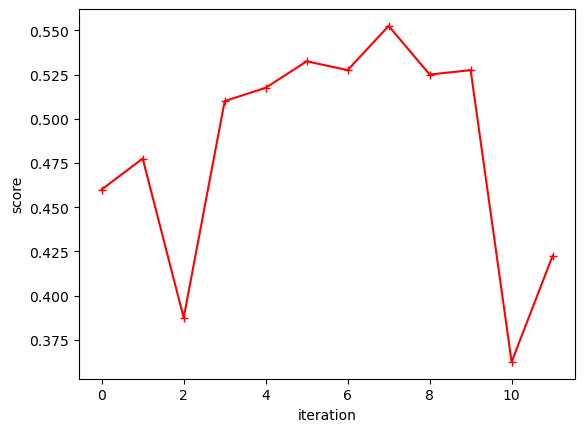

In [37]:
plt.plot(score,'r-+')
plt.xlabel('iteration')
plt.ylabel('score')

In [38]:
train_score =[i.score(x1, y1)for i in dt_model2]

In [39]:
test_score = [i.score(x_test, y_test)for i in dt_model2]

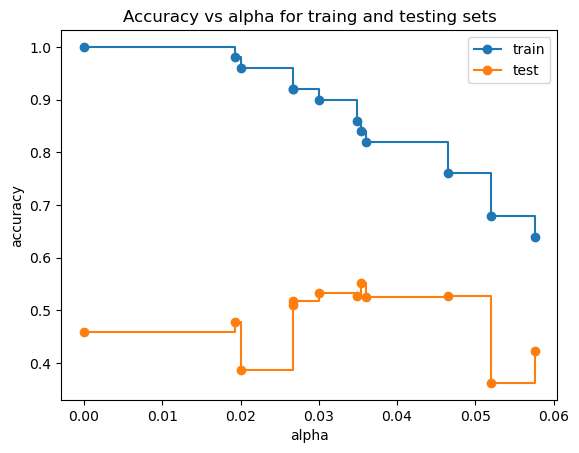

In [40]:
#cheaking accuracy
fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for traing and testing sets")
ax.plot(ccp_alpha, train_score, marker='o',label="train",drawstyle="steps-post")
ax.plot(ccp_alpha, test_score, marker='o', label="test",drawstyle="steps-post")
ax.legend()
plt.show()

In [41]:
dt_model_ccp = DecisionTreeClassifier(random_state=0, ccp_alpha = 0.014)
dt_model_ccp.fit(x1, y1)

DecisionTreeClassifier(ccp_alpha=0.014, random_state=0)

[Text(0.44166666666666665, 0.95, 'x[9] <= 0.515\ngini = 0.538\nsamples = 50\nvalue = [4, 32, 10, 4]'),
 Text(0.2, 0.85, 'x[9] <= 0.475\ngini = 0.56\nsamples = 5\nvalue = [3, 1, 0, 1]'),
 Text(0.13333333333333333, 0.75, 'x[10] <= 9.7\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 0, 1]'),
 Text(0.06666666666666667, 0.65, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0]'),
 Text(0.2, 0.65, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 1]'),
 Text(0.26666666666666666, 0.75, 'gini = 0.0\nsamples = 3\nvalue = [3, 0, 0, 0]'),
 Text(0.6833333333333333, 0.85, 'x[10] <= 10.55\ngini = 0.471\nsamples = 45\nvalue = [1, 31, 10, 3]'),
 Text(0.5, 0.75, 'x[1] <= 0.285\ngini = 0.414\nsamples = 42\nvalue = [0, 31, 8, 3]'),
 Text(0.3333333333333333, 0.65, 'x[6] <= 81.5\ngini = 0.444\nsamples = 3\nvalue = [0, 0, 2, 1]'),
 Text(0.26666666666666666, 0.55, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 2, 0]'),
 Text(0.4, 0.55, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 1]'),
 Text(0.6666666666666666, 0.65, 'x[6] <= 20.5\n

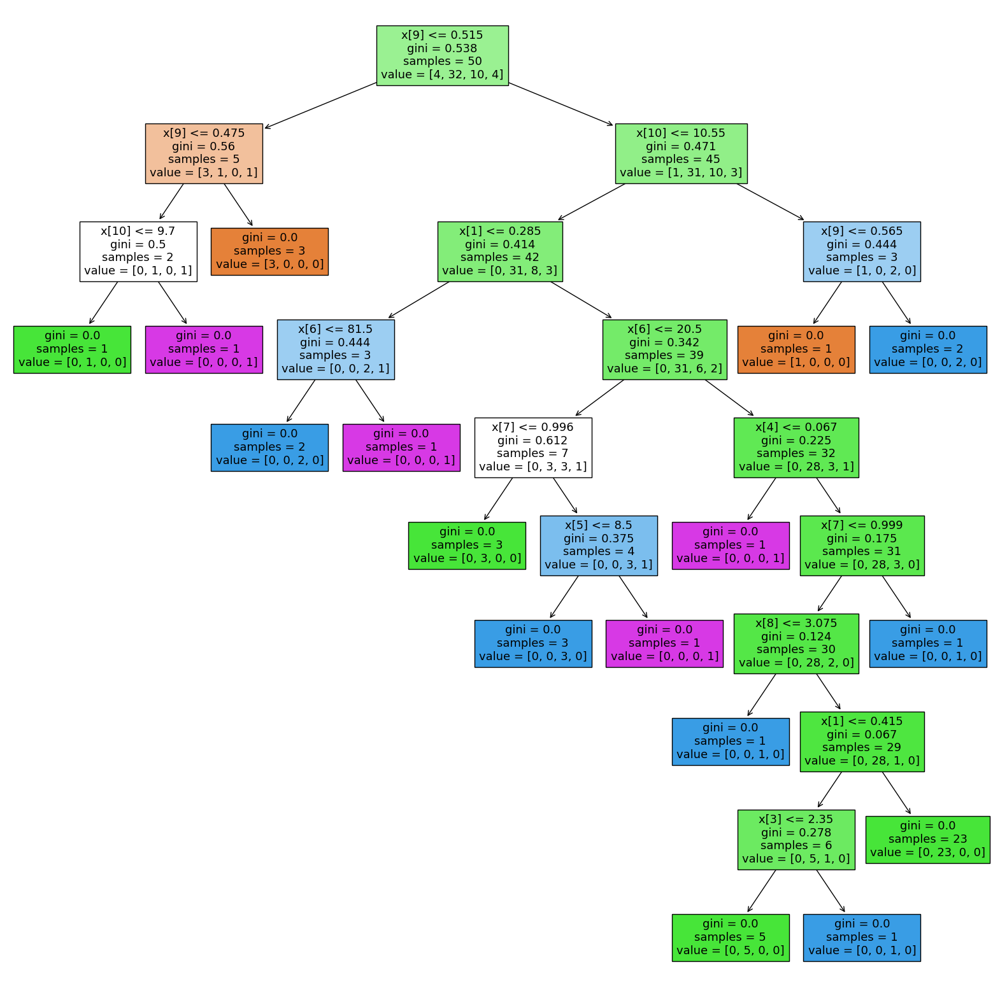

In [42]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_ccp,filled=True)

In [43]:
dt_model_ccp.score(x1, y1)

1.0

In [44]:
dt_model_ccp.score(x_test, y_test)

0.4875

In [45]:
DecisionTreeClassifier()

DecisionTreeClassifier()